# Support Vector Machines

Snippets of code were taken from: https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.07-Support-Vector-Machines.ipynb

In [14]:
import zipfile
with zipfile.ZipFile('data/fruit.zip', 'r') as zip_ref:
    zip_ref.extractall('out/fruit')
print('Done')

Done


In [15]:
import os

# I want to have the same amount of data as the notebook which the code snippets were taken from

def remove_files_recursive(directory_path):
    for root, dirs, _ in os.walk(directory_path):
        for dir in dirs:
            file_keep_count = 60
            for file in os.listdir(os.path.join(root, dir)):
                if file_keep_count > 0:
                    file_keep_count -= 1
                else:
                    os.remove(os.path.join(root, dir, file))

directory_path = 'out/fruit'

remove_files_recursive(directory_path)


In [16]:
from sklearn.datasets import load_files

main_directory = 'out/fruit'

fruit_image_bunch = load_files(main_directory, shuffle=True)

fruit_image_bunch

{'data': [b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x08\x06\x06\x07\x06\x05\x08\x07\x07\x07\t\t\x08\n\x0c\x14\r\x0c\x0b\x0b\x0c\x19\x12\x13\x0f\x14\x1d\x1a\x1f\x1e\x1d\x1a\x1c\x1c $.\' ",#\x1c\x1c(7),01444\x1f\'9=82<.342\xff\xdb\x00C\x01\x08\t\t\x0c\x0b\x0c\x18\r\r\x182!\x1c!22222222222222222222222222222222222222222222222222\xff\xc0\x00\x11\x08\x01,\x01,\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd

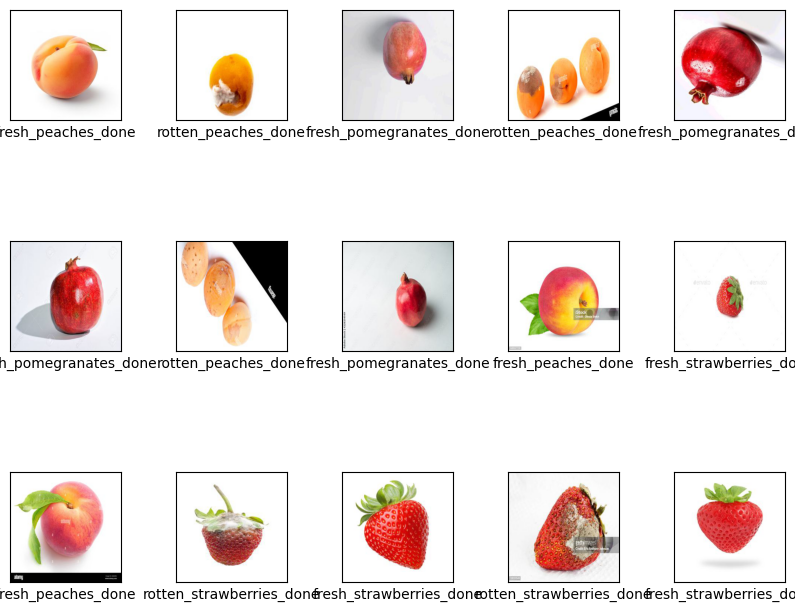

In [17]:
from sklearn.datasets import load_files
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np


def load_images_from_directory(directory):
    # Use sk-learn's load_files to load all the images in the directory with labels
    bunch_object = load_files(directory)

    # To convert the data into a format which works with scikit-learn
    bunch_object.data = np.array([imread(file) for file in bunch_object.filenames])

    return bunch_object


main_directory = "out/fruit"
fruit_image_bunch = load_images_from_directory(main_directory)

fig, ax = plt.subplots(3, 5, figsize=(10, 8))

plt.subplots_adjust(wspace=0.5, hspace=0.5)

for i, axi in enumerate(ax.flat):
    img_float = fruit_image_bunch.data[i].astype(int)

    axi.imshow(img_float)
    axi.set(
        xticks=[], # To get rid of the ticks on the x-axis
        yticks=[], # To get rid of the ticks on the y-axis`
        xlabel=fruit_image_bunch.target_names[fruit_image_bunch.target[i]],
    )

plt.show()

In [22]:
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

pca = PCA(n_components=2, whiten=True,
          svd_solver='randomized', random_state=42)
svc = SVC(kernel='rbf', class_weight='balanced')
model = make_pipeline(pca, svc)


In [23]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(fruit_image_bunch.data, fruit_image_bunch.target,
                                                random_state=42)
num_samples, height, width, channels = Xtrain.shape
Xtrain_flattened = Xtrain.reshape((num_samples, height * width * channels))

num_samples_test, _, _, _ = Xtest.shape
Xtest_flattened = Xtest.reshape((num_samples_test, height * width * channels))


In [24]:
from sklearn.model_selection import GridSearchCV
param_grid = {'svc__C': [1, 5, 10, 50],
              'svc__gamma': [0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model, param_grid)

grid.fit(Xtrain_flattened, ytrain)
print(grid.best_params_)

{'svc__C': 50, 'svc__gamma': 0.005}


In [25]:
model = grid.best_estimator_
yfit = model.predict(Xtest_flattened)

ValueError: Found array with dim 4. PCA expected <= 2.